In [ ]:
import pandas as pd
import plotly as plt

data1 = pd.read_csv('/content/dataset_TSMC2014_TKY.csv')
data1.head(10)

,userId,venueId,venueCategoryId,venueCategory,latitude,longitude,timezoneOffset,utcTimestamp
0,1541,4f0fd5a8e4b03856eeb6c8cb,4bf58dd8d48988d10c951735,Cosmetics Shop,35.705101,139.619590,540,Tue Apr 03 18:17:18 +0000 2012
1,868,4b7b884ff964a5207d662fe3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.715581,139.800317,540,Tue Apr 03 18:22:04 +0000 2012
2,114,4c16fdda96040f477cc473a5,4d954b0ea243a5684a65b473,Convenience Store,35.714542,139.480065,540,Tue Apr 03 19:12:07 +0000 2012
3,868,4c178638c2dfc928651ea869,4bf58dd8d48988d118951735,Food & Drink Shop,35.725592,139.776633,540,Tue Apr 03 19:12:13 +0000 2012
4,1458,4f568309e4b071452e447afe,4f2a210c4b9023bd5841ed28,Housing Development,35.656083,139.734046,540,Tue Apr 03 19:18:23 +0000 2012
5,1541,4b83b207f964a5202c0d31e3,4bf58dd8d48988d1f8941735,Furniture / Home Store,35.705074,139.619502,540,Tue Apr 03 19:20:09 +0000 2012
6,1541,4ea281c302d529c116a57755,4d954b0ea243a5684a65b473,Convenience Store,35.706277,139.617782,540,Tue Apr 03 19:21:00 +0000 2012
7,114,4b3eae5cf964a520b4a025e3,4bf58dd8d48988d129951735,Train Station,35.700253,139.480255,540,Tue Apr 03 19:35:36 +0000 2012
8,1635,4cca7bd67965b60c80f0858a,4bf58dd8d48988d162941735,Other Great Outdoors,35.755759,139.733573,540,Tue Apr 03 19:51:50 +0000 2012
9,2033,4b5c7671f964a520083129e3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.693121,139.699447,540,Tue Apr 03 19:51:59 +0000 2012


In [ ]:
#identifikasi data hilang
data_hilang = data1.isnull().sum()
print(data_hilang)

userId             0
venueId            0
venueCategoryId    0
venueCategory      0
latitude           0
longitude          0
timezoneOffset     0
utcTimestamp       0
dtype: int64


In [ ]:
print("Jumlah baris sebelum menghapus duplikat:", len(data1))

Jumlah baris sebelum menghapus duplikat: 573703


In [ ]:
#identifikasi duplikat data
duplikat = data1.duplicated().sum()
print(f"\nJumlah baris duplikat: {duplikat}")
# Menghapus data duplikat (opsional)
data= data1.drop_duplicates()
duplikat_data = data.duplicated().sum()
print(f"\nJumlah baris duplikat setelah penghapusan: {duplikat_data}")


Jumlah baris duplikat: 577

Jumlah baris duplikat setelah penghapusan: 0


In [ ]:
print("Jumlah baris setelah menghapus duplikat:", len(data))

Jumlah baris setelah menghapus duplikat: 573126


In [ ]:
data.head()

,userId,venueId,venueCategoryId,venueCategory,latitude,longitude,timezoneOffset,utcTimestamp
0,1541,4f0fd5a8e4b03856eeb6c8cb,4bf58dd8d48988d10c951735,Cosmetics Shop,35.705101,139.619590,540,Tue Apr 03 18:17:18 +0000 2012
1,868,4b7b884ff964a5207d662fe3,4bf58dd8d48988d1d1941735,Ramen / Noodle House,35.715581,139.800317,540,Tue Apr 03 18:22:04 +0000 2012
2,114,4c16fdda96040f477cc473a5,4d954b0ea243a5684a65b473,Convenience Store,35.714542,139.480065,540,Tue Apr 03 19:12:07 +0000 2012
3,868,4c178638c2dfc928651ea869,4bf58dd8d48988d118951735,Food & Drink Shop,35.725592,139.776633,540,Tue Apr 03 19:12:13 +0000 2012
4,1458,4f568309e4b071452e447afe,4f2a210c4b9023bd5841ed28,Housing Development,35.656083,139.734046,540,Tue Apr 03 19:18:23 +0000 2012


In [ ]:
sampled_data1 = data.sample(frac=0.1, random_state=42)
sampled_data1['day_of_week'] = pd.to_datetime(sampled_data1['utcTimestamp'], errors='coerce').dt.day_name()

<ipython-input-7-0eaa0713a0dd>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sampled_data1['day_of_week'] = pd.to_datetime(sampled_data1['utcTimestamp'], errors='coerce').dt.day_name()


In [ ]:
print(sampled_data1.head())

        userId                   venueId           venueCategoryId  \
284621    1214  4e60e13a52b1260c126d21a2  4bf58dd8d48988d110941735   
281001     258  4b56345ff964a520330528e3  4bf58dd8d48988d129951735   
484786    1554  4b67a5c4f964a52069592be3  4bf58dd8d48988d129951735   
115634     849  4b5ef219f964a520569f29e3  4bf58dd8d48988d129951735   
151626    1098  4b18bed2f964a5207dd523e3  4bf58dd8d48988d129951735   

             venueCategory   latitude   longitude  timezoneOffset  \
284621  Italian Restaurant  35.631996  139.577595             540   
281001       Train Station  35.532754  139.700743             540   
484786       Train Station  35.670676  139.702524             540   
115634       Train Station  35.727771  139.770963             540   
151626       Train Station  35.702309  139.745032             540   

                          utcTimestamp day_of_week  
284621  Mon Jul 16 11:23:00 +0000 2012      Monday  
281001  Sun Jul 15 10:15:11 +0000 2012      Sunday  
48478

<ipython-input-9-ad2102f133f8>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Total Check-ins', y='Venue Category', data=top_10_categories, palette='viridis')


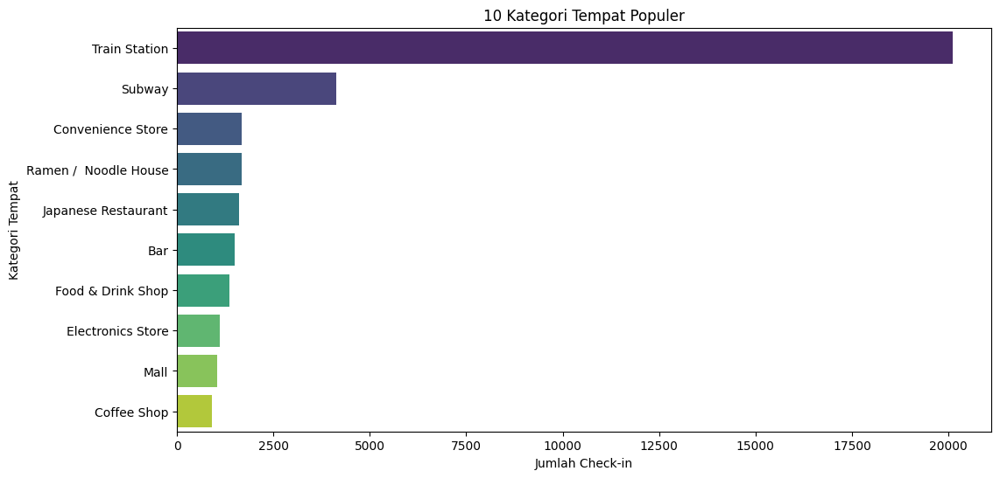

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import ast

# Calculate total check-ins per category
total_counts = sampled_data1.groupby('venueCategory').size()

# Create a DataFrame for plotting
popularity_df = pd.DataFrame({'Venue Category': total_counts.index, 'Total Check-ins': total_counts.values})

# Sort by Total Check-ins and take the top 10
top_10_categories = popularity_df.sort_values(by=['Total Check-ins'], ascending=False).head(10)

# Visualisasi Data dengan Bar Chart
plt.figure(figsize=(12, 6))

# Barplot untuk Jumlah Check-In pada 10 Kategori Terbanyak
sns.barplot(x='Total Check-ins', y='Venue Category', data=top_10_categories, palette='viridis')
#tambahkan judul dan label
plt.title('10 Kategori Tempat Populer')
plt.xlabel('Jumlah Check-in')
plt.ylabel('Kategori Tempat')
plt.show()


In [ ]:
import plotly.express as px

# Replace invalid dates with NaT (Not a Time)
sampled_data1['day_of_week'] = sampled_data1['day_of_week'].fillna(pd.NaT)

sampled_data1['is_weekend'] = sampled_data1['day_of_week'].isin(['Saturday', 'Sunday'])

# Jumlah check-in per kategori
weekday_counts = sampled_data1[~sampled_data1['is_weekend']].groupby('venueCategory').size()
weekend_counts = sampled_data1[sampled_data1['is_weekend']].groupby('venueCategory').size()

# Gabungkan untuk visualisasi
popularity_comparison = pd.DataFrame({
    'Weekday': weekday_counts,
    'Weekend': weekend_counts
}).fillna(0)

popularity_comparison['Total'] = popularity_comparison['Weekday'] + popularity_comparison['Weekend']

# Ambil 10 kategori terpopuler berdasarkan total kunjungan
top_10_categories = popularity_comparison.sort_values(by=['Total'], ascending=False).head(10).index

# Filter data untuk hanya menyertakan 10 kategori terpopuler
filtered_comparison = popularity_comparison.loc[top_10_categories]

my_colors = ['blue', 'gold']
# Plot
fig = px.bar(filtered_comparison,
             x=['Weekday', 'Weekend'],
             y=filtered_comparison.index,
             title='Jumlah Kunjungan Weekend VS Weekdays (10 Kategori Terpopuler)',
             labels={'x': 'Kategori Tempat', 'value': 'Jumlah Check-in'},
             color_discrete_sequence=my_colors)
fig.show()

In [ ]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# Mengambil kolom latitude dan longitude
locations = data[['latitude', 'longitude']].values

# Membuat peta awal dengan titik tengah pada data
center_lat, center_lng = data['latitude'].mean(), data['longitude'].mean()
m = folium.Map(location=[center_lat, center_lng], zoom_start=12)

# Menambahkan heatmap
# Convert the gradient keys to strings
gradient = {str(k): v for k, v in {0.2: 'yellow', 0.5: 'blue', 1: 'green'}.items()}
HeatMap(locations, min_opacity=0.2, radius=10, blur=15, max_zoom=1, gradient=gradient).add_to(m)

# Menampilkan peta
m
